In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"]= (10,2)
from statsmodels.tsa.stattools import adfuller
import warnings
warnings.filterwarnings("ignore")
import plotly.express as px
from sklearn.impute import KNNImputer
import sys
sys.path.append("D://NILM/code/")
from common import scatter, sliderPlot#, create_features
from main import NILM

In [2]:
def plot_double_lines(data1, data2, date, y1_label='Line 1', y2_label='Line 2', y2_width=5, y2_color='black'):
    fig = px.line(x=data1.loc[date].index, y=data1[date])
    fig.add_scatter(x=data2.loc[date].index, y=data2[date], mode='lines')
    fig.update_traces(name=y1_label, selector=dict(type='scatter'))
    fig.update_traces(name=y2_label, selector=dict(type='scatter', mode='lines'), line=dict(width=y2_width, color=y2_color))
    fig.update_xaxes(
        rangeslider_visible=True)
    fig.show()

In [3]:
""" data ingestion """

# lst = ['wm',"ac1","f",'tv']
lst = ['ac']
path = "d:/NILM/Data_files/Parquet/Appliances12_06_04_08/"

""" data ingestion done """

""" data validation and transformation """
complete_data_lst = []
date_dit ={}
for i in range(len(lst)):
    counter = 0
    dit = {}
    df = pd.read_parquet(f"{path}{lst[i]}.parquet")
    df['timestamp'] = pd.to_datetime(df['timestamp'])
    df.drop_duplicates(inplace=True)
    df.set_index(['timestamp'],inplace=True ,drop=True)  
    df.drop(df[(df['frequency']>51) | (df['frequency']<49)].index, inplace=True)
    df.drop(df[(df['PF']>1) | (df['PF']<0)].index, inplace=True)
    # df.drop(df[(df['current']>20) |(df['current']<0.07)].index, inplace=True)
    df.drop(df[df['voltage']<140].index, inplace=True)
    
    """ data validation done """
    
    """ data transformation """
    df['power'] = (df['voltage'] * df['current'] * df['PF']).round(2)
    if lst[i]=="f":
        df_appliance = df[['power',"voltage",'current']].resample(rule="1s").asfreq()
        df_appliance = df_appliance.rename(columns={'power': f'{lst[i]}_A', 'voltage': f'{lst[i]}_V', 'current': f'{lst[i]}_C'})
        unique_dates = pd.Series(df.index.date).unique()
        for date1 in unique_dates:
            hours_lst = []
            df_date = df[df.index.to_series().dt.date == date1]
            hours = df_date.index.hour.unique()
            for y in hours:
                hours_lst.append(y)
                counter+=1
            dit[f"{date1}"] = hours_lst
    else:
        df_sample_lst = []
        unique_dates = pd.Series(df.index.date).unique()
        for date1 in unique_dates:
            hours_lst = []
            df_date = df[df.index.to_series().dt.date == date1]
            hours = df_date.index.hour.unique()
            for y in hours:
                if hours.empty:
                    continue
                hours_lst.append(y)
                date2 = f"{date1} {y:02d}"
                df_hour = df_date.loc[date2]
                counter+=1
                mins = df_hour.index.minute.unique()
                if mins.empty:
                    continue
                for m in mins:
                    date3 = f"{date2}{m:02d}"
                    df_min = df_hour.loc[date3]
                    df_resampled_hour = df_min[['power',"voltage",'current']].resample(rule="1s").asfreq()
                    df_sample_lst.append(df_resampled_hour) # adding each hour data in lst


        df_appliance = pd.concat(df_sample_lst)
        df_appliance = df_appliance.rename(columns={'power': f'{lst[i]}_A', 'voltage': f'{lst[i]}_V', 'current': f'{lst[i]}_C'})

    date_dit[f"{lst[i]}"] = dit
    print(f"days when {lst[i]} is active :", len(unique_dates))
    print("no. of hours:", counter)
    complete_data_lst.append(df_appliance)


days when ac is active : 50
no. of hours: 148


In [4]:
df = complete_data_lst[0]
print(len(df), df['ac_A'].isna().sum())
df

341412 3680


,ac_A,ac_V,ac_C
timestamp,,,
2013-06-12 15:37:44,1695.42,206.51,8.318
2013-06-12 15:37:45,1693.94,206.49,8.320
2013-06-12 15:37:46,1692.68,206.57,8.319
2013-06-12 15:37:47,1693.01,206.50,8.315
2013-06-12 15:37:48,1693.09,206.56,8.313
...,...,...,...
2013-08-03 17:32:16,1695.33,203.78,8.429
2013-08-03 17:32:17,1698.77,203.82,8.453
2013-08-03 17:32:18,1697.96,203.83,8.440


In [5]:
df1 = df.loc['2013-06-19'].copy()
df1

,ac_A,ac_V,ac_C
timestamp,,,
2013-06-19 16:08:32,1610.67,232.85,6.980
2013-06-19 16:08:33,1610.09,232.80,6.979
2013-06-19 16:08:34,1610.13,232.84,6.978
2013-06-19 16:08:35,NaN,NaN,NaN
2013-06-19 16:08:36,NaN,NaN,NaN
...,...,...,...
2013-06-19 17:33:15,1744.84,217.84,8.266
2013-06-19 17:33:16,1744.42,217.76,8.267
2013-06-19 17:33:17,1746.23,218.08,8.272


In [6]:
df1.isna().sum()

ac_A    46
ac_V    46
ac_C    46
dtype: int64

In [7]:
def create_features(hourly_data):
    hourly_data = hourly_data.copy()
    # Check if the index is in datetime format
    if not isinstance(hourly_data.index, pd.DatetimeIndex):
        hourly_data.index = pd.to_datetime(hourly_data.index)
    
    hourly_data['sec'] = hourly_data.index.second
    hourly_data['minute'] = hourly_data.index.minute
    hourly_data['hour'] = hourly_data.index.hour
    # hourly_data['day'] = hourly_data.index.day
    # hourly_data['dayofweek'] = hourly_data.index.dayofweek
    # hourly_data['weekofyear'] = hourly_data.index.isocalendar().week
    # hourly_data['month'] = hourly_data.index.month
    return hourly_data
df1 = create_features(df1)
df1

,ac_A,ac_V,ac_C,sec,minute,hour
timestamp,,,,,,
2013-06-19 16:08:32,1610.67,232.85,6.980,32,8,16
2013-06-19 16:08:33,1610.09,232.80,6.979,33,8,16
2013-06-19 16:08:34,1610.13,232.84,6.978,34,8,16
2013-06-19 16:08:35,NaN,NaN,NaN,35,8,16
2013-06-19 16:08:36,NaN,NaN,NaN,36,8,16
...,...,...,...,...,...,...
2013-06-19 17:33:15,1744.84,217.84,8.266,15,33,17
2013-06-19 17:33:16,1744.42,217.76,8.267,16,33,17
2013-06-19 17:33:17,1746.23,218.08,8.272,17,33,17


In [13]:
df=create_features(df)
original_timestamps = df.index
knn_imputer = KNNImputer(n_neighbors=1)
imputed_data = knn_imputer.fit_transform(df)

imputed_df1 = pd.DataFrame(imputed_data, columns=df.columns)
imputed_df1['Timestamp'] = original_timestamps
imputed_df1.set_index(['Timestamp'],drop=True,inplace=True)
# sliderPlot(df['ac1_A'].loc['2013-06-19'],t="line")
# sliderPlot(imputed_df1['ac1_A'],t="line")
plot_double_lines(imputed_df1['ac_A'], df['ac_A'], '2013-06-19')

In [14]:
df=create_features(df)
original_timestamps = df.index
knn_imputer = KNNImputer(n_neighbors=2)
imputed_data = knn_imputer.fit_transform(df)

imputed_df1 = pd.DataFrame(imputed_data, columns=df.columns)
imputed_df1['Timestamp'] = original_timestamps
imputed_df1.set_index(['Timestamp'],drop=True,inplace=True)
# sliderPlot(df['ac1_A'].loc['2013-06-19'],t="line")
# sliderPlot(imputed_df1['ac1_A'],t="line")
plot_double_lines(imputed_df1['ac_A'], df['ac_A'], '2013-06-19')

In [15]:
plot_double_lines(imputed_df1['ac_A'], df['ac_A'], '2013-06')

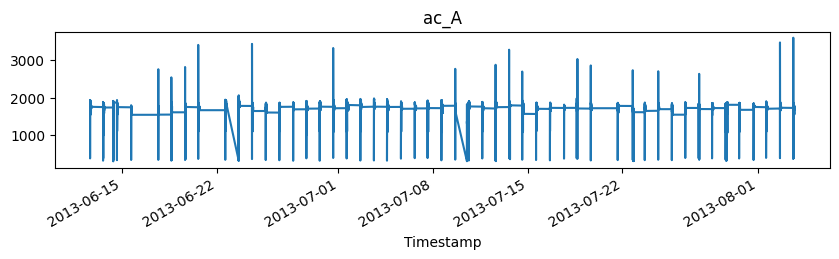

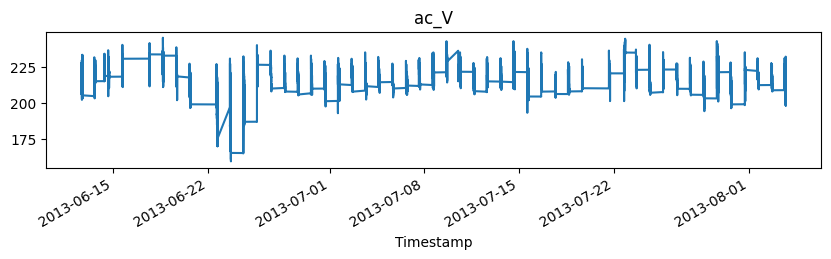

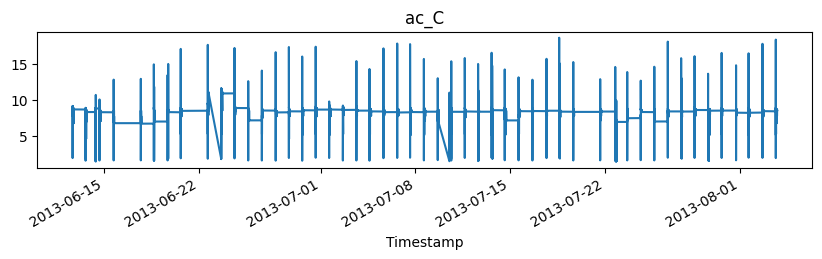

In [16]:
for i in [0,1,2]:
    imputed_df1[imputed_df1.columns[i]].plot()
    plt.title(imputed_df1.columns[i])
    plt.show()
    

In [21]:
imputed_df1['ac_C'].describe()

count    341412.000000
mean          8.102553
std           1.422180
min           1.436000
25%           7.596000
50%           8.499000
75%           8.672000
max          18.646000
Name: ac_C, dtype: float64

In [95]:
df1 = imputed_df1[["ac_A","ac_V","ac_C"]]
# df.reset_index(inplace=True)
df1.to_csv("d:/clean_data/c_ac.csv")
df1

,ac_A,ac_V,ac_C
Timestamp,,,
2013-06-12 15:37:44,1695.42,206.51,8.318
2013-06-12 15:37:45,1693.94,206.49,8.320
2013-06-12 15:37:46,1692.68,206.57,8.319
2013-06-12 15:37:47,1693.01,206.50,8.315
2013-06-12 15:37:48,1693.09,206.56,8.313
...,...,...,...
2013-08-03 17:32:16,1695.33,203.78,8.429
2013-08-03 17:32:17,1698.77,203.82,8.453
2013-08-03 17:32:18,1697.96,203.83,8.440


In [96]:
df= pd.read_csv("d:/clean_data/c_ac.csv")
df

,Timestamp,ac_A,ac_V,ac_C
0,2013-06-12 15:37:44,1695.42,206.51,8.318
1,2013-06-12 15:37:45,1693.94,206.49,8.320
2,2013-06-12 15:37:46,1692.68,206.57,8.319
3,2013-06-12 15:37:47,1693.01,206.50,8.315
4,2013-06-12 15:37:48,1693.09,206.56,8.313
...,...,...,...,...
341407,2013-08-03 17:32:16,1695.33,203.78,8.429
341408,2013-08-03 17:32:17,1698.77,203.82,8.453
341409,2013-08-03 17:32:18,1697.96,203.83,8.440
341410,2013-08-03 17:32:19,1698.43,203.91,8.439


In [87]:
start_datetime = '2013-06-12 00:00:00'
end_datetime = '2013-08-03 23:59:59'
datetime_index = pd.date_range(start=start_datetime, end=end_datetime, freq='S')

df = pd.DataFrame(index=datetime_index, columns=df1.columns)
# df.index.name = 'timestamp'
df3 = df.combine_first(df1)
df3.index.name = 'timestamp'
df3

,ac_A,ac_V,ac_C
timestamp,,,
2013-06-12 00:00:00,NaN,NaN,NaN
2013-06-12 00:00:01,NaN,NaN,NaN
2013-06-12 00:00:02,NaN,NaN,NaN
2013-06-12 00:00:03,NaN,NaN,NaN
2013-06-12 00:00:04,NaN,NaN,NaN
...,...,...,...
2013-08-03 23:59:55,NaN,NaN,NaN
2013-08-03 23:59:56,NaN,NaN,NaN
2013-08-03 23:59:57,NaN,NaN,NaN


In [88]:
df3.value_counts().sum()

341412

In [89]:
df3.fillna(value=0,inplace=True)

In [77]:
sliderPlot(df3['ac_A'].loc['2013-06-12'],t="line")

<Axes: >

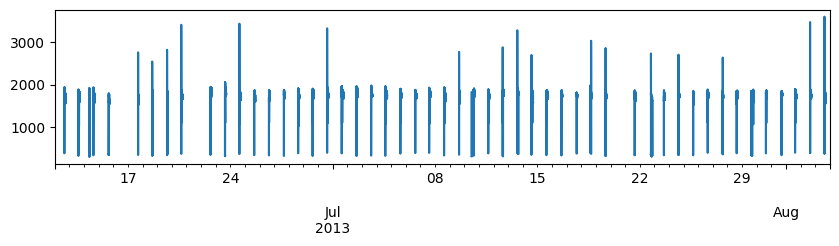

In [74]:
df3['ac_A'].plot()

In [90]:
df3.to_csv("d:/clean_data/c_ac.csv")

In [91]:
df = pd.read_csv("d:/clean_data/c_ac.csv")
df

,timestamp,ac_A,ac_V,ac_C
0,2013-06-12 00:00:00,0.0,0.0,0.0
1,2013-06-12 00:00:01,0.0,0.0,0.0
2,2013-06-12 00:00:02,0.0,0.0,0.0
3,2013-06-12 00:00:03,0.0,0.0,0.0
4,2013-06-12 00:00:04,0.0,0.0,0.0
...,...,...,...,...
4579195,2013-08-03 23:59:55,0.0,0.0,0.0
4579196,2013-08-03 23:59:56,0.0,0.0,0.0
4579197,2013-08-03 23:59:57,0.0,0.0,0.0
4579198,2013-08-03 23:59:58,0.0,0.0,0.0


In [59]:
df3 = imputed_df1.rolling(window=4).mean()
df3

,ac1_A,ac1_V,ac1_C,sec,minute,hour
Timestamp,,,,,,
2013-06-12 15:37:44,NaN,NaN,NaN,NaN,NaN,NaN
2013-06-12 15:37:45,NaN,NaN,NaN,NaN,NaN,NaN
2013-06-12 15:37:46,NaN,NaN,NaN,NaN,NaN,NaN
2013-06-12 15:37:47,1693.7625,206.5175,8.31800,45.5,37.0,15.0
2013-06-12 15:37:48,1693.1800,206.5300,8.31675,46.5,37.0,15.0
...,...,...,...,...,...,...
2013-08-03 17:32:16,1696.3725,203.8025,8.43325,14.5,32.0,17.0
2013-08-03 17:32:17,1696.5575,203.8100,8.43600,15.5,32.0,17.0
2013-08-03 17:32:18,1696.9925,203.8200,8.43775,16.5,32.0,17.0


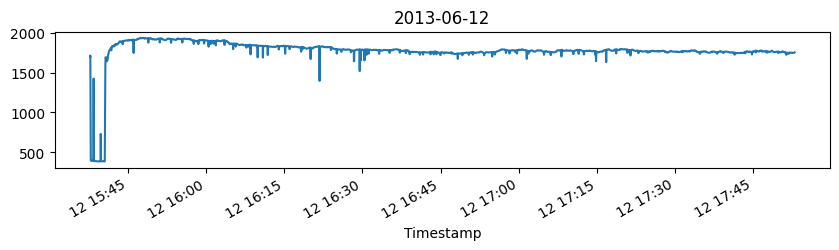

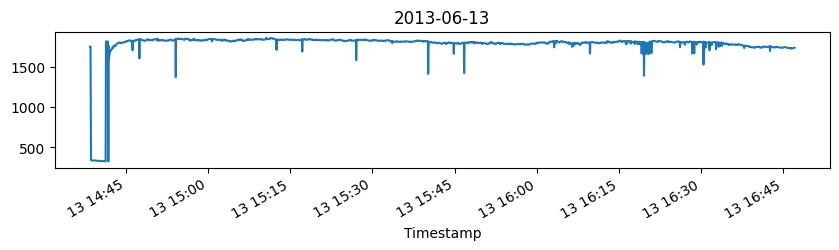

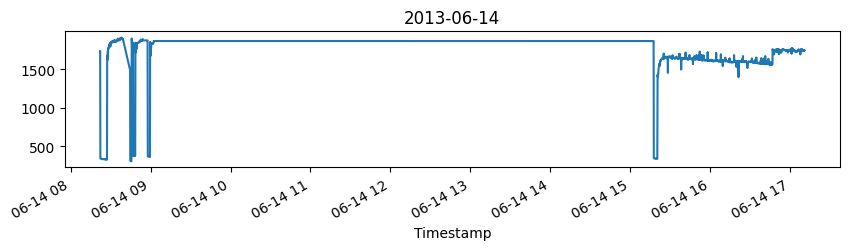

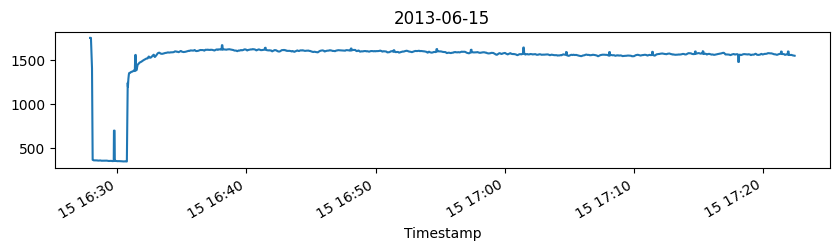

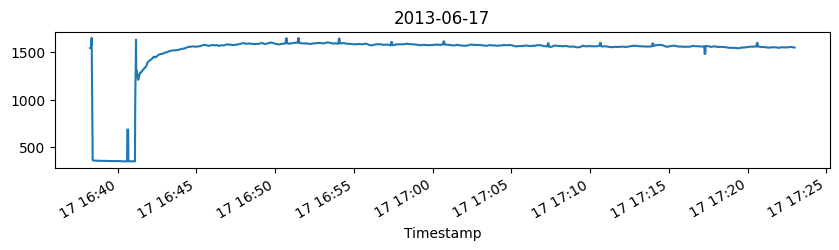

...

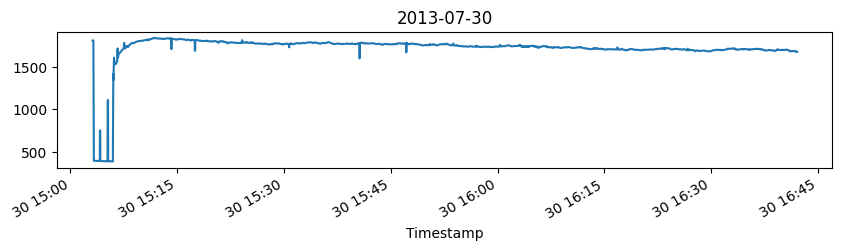

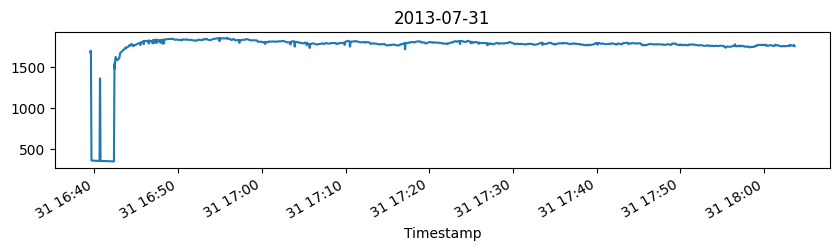

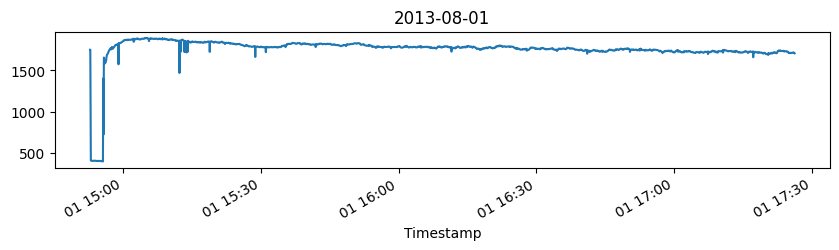

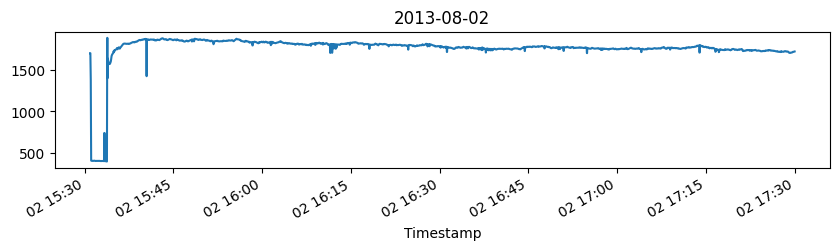

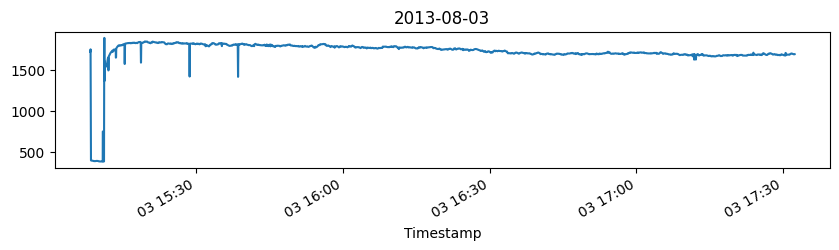

In [73]:
# udate = df3.index.date.unique()
udate = pd.Series(df3.index.date).unique()
for i in udate:
    if i == "2013-07-01":
        break
    # print(i)
    # sliderPlot(df3['ac1_A'].loc[f"{i}"],t="line")
    df3['ac1_A'].loc[f"{i}"].plot()
    plt.title(i)
    plt.show()

In [74]:
sliderPlot(df3['ac1_A'].loc['2013-06-12'],t="line")

In [36]:
# df=create_features(df)
original_timestamps = df1.index
knn_imputer = KNNImputer(n_neighbors=1)
imputed_data = knn_imputer.fit_transform(df1)

imputed_df1 = pd.DataFrame(imputed_data, columns=df1.columns)
imputed_df1['Timestamp'] = original_timestamps
imputed_df1.set_index(['Timestamp'],drop=True,inplace=True)
# sliderPlot(df['ac1_A'].loc['2013-06-19'],t="line")
# sliderPlot(imputed_df1['ac1_A'],t="line")
plot_double_lines(imputed_df1['ac1_A'], df['ac1_A'], '2013-06-19')

In [81]:
df3

,ac1_A,ac1_V,ac1_C,sec,minute,hour
Timestamp,,,,,,
2013-06-12 15:37:44,NaN,NaN,NaN,NaN,NaN,NaN
2013-06-12 15:37:45,NaN,NaN,NaN,NaN,NaN,NaN
2013-06-12 15:37:46,NaN,NaN,NaN,NaN,NaN,NaN
2013-06-12 15:37:47,1693.7625,206.5175,8.31800,45.5,37.0,15.0
2013-06-12 15:37:48,1693.1800,206.5300,8.31675,46.5,37.0,15.0
...,...,...,...,...,...,...
2013-08-03 17:32:16,1696.3725,203.8025,8.43325,14.5,32.0,17.0
2013-08-03 17:32:17,1696.5575,203.8100,8.43600,15.5,32.0,17.0
2013-08-03 17:32:18,1696.9925,203.8200,8.43775,16.5,32.0,17.0


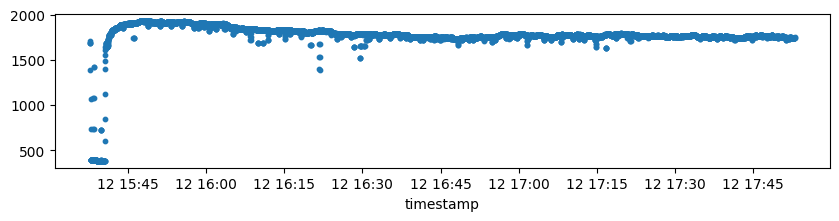

In [83]:
# scatter(df3.loc['2013-06'])
plt.scatter(df3.loc['2013-06-12'].index, df3['ac1_A'].loc['2013-06-12'],s=10)
plt.xlabel('timestamp')
# plt.title('current')
plt.show()

In [84]:
sliderPlot(df3['ac1_A'].loc['2013-06-12'])

In [26]:
import plotly.express as px

def plot_double_lines(data1, data2, date, y1_label='Line 1', y2_label='Line 2', y2_width=5, y2_color='black'):
    fig = px.line(x=data1.loc[date].index, y=data1[date])
    fig.add_scatter(x=data2.loc[date].index, y=data2[date], mode='lines')
    fig.update_traces(name=y1_label, selector=dict(type='scatter'))
    fig.update_traces(name=y2_label, selector=dict(type='scatter', mode='lines'), line=dict(width=y2_width, color=y2_color))
    fig.update_xaxes(
        rangeslider_visible=True)
    fig.show()

plot_double_lines(imputed_df1['ac1_A'], df['ac1_A'], '2013-06-19')
# sliderPlot(df['ac1_A'].loc['2013-06-19'],t="line")
# sliderPlot(imputed_df1['ac1_A'],t="line")